# Milestone Project 1: Food Vision Big

See the annotated version of this notebook on GibHub: https://github.com/mrdbourke/tensorflow-deep-learning/blob/main/07_food_vision_milestone_project_1.ipynb

## Check GPU

Google Colab Processors That Support Mixed-Precision
* A100 GPU ✅ Supports mixed-precision with Tensor Cores
* L4 GPU ✅ Supports mixed-precision with Tensor Cores
* T4 GPU ✅ Supports mixed-precision with Tensor Cores
* v5e-1 TPU ✅ Supports bfloat16 for mixed-precision training
* v2-8 TPU ✅ Supports bfloat16 for mixed-precision training

Key Takeaways
* For TensorFlow/Keras mixed-precision training: Use **TPUs (v2-8, v5e-1)** or **NVIDIA GPUs (A100, L4, T4)**.
* For PyTorch mixed-precision: Use **NVIDIA GPUs (A100, L4, T4)** with `torch.cuda.amp`.


In [ ]:
# See what type of GPU we're using
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-72eed3e2-28da-15ef-8644-bbe004f7e4c1)


## Get helper functions

In [ ]:
# Download helper functions script
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/extras/helper_functions.py

--2025-03-12 21:38:58--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/extras/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10246 (10K) [text/plain]
Saving to: ‘helper_functions.py’

helper_functions.py 100%[===================>]  10.01K  --.-KB/s    in 0s      

2025-03-12 21:38:58 (99.9 MB/s) - ‘helper_functions.py’ saved [10246/10246]



In [ ]:
# Import series of helper functions for the notebook
from helper_functions import create_tensorboard_callback, plot_loss_curves, compare_historys

## Use TensorFlow Datasets to Download Data

If you want to get an overview of TensorFlow Datasets (TFDS), read the guide: https://www.tensorflow.org/datasets

In [ ]:
# Get TensorFlow Datasets
import tensorflow_datasets as tfds

In [ ]:
# List all of the available datasets
datasets_list = tfds.list_builders()
print('food101' in datasets_list) # is our target dataset in the list of TFDS datasets?

True


In [ ]:
len(datasets_list)

1303

**What is TensorFlow Datasets (TFDS)**

TensorFlow Datasets is a place for prepared and ready-to-use machine learning datasets.
* Why use TensorFlow Datasets?
 * Load data already in tensor format
 * Practice on well established datasets (for many different problem types)
 * Experiment with different modelling techniques on a consistent dataset
* Why *NOT* use TensorFlow Datasets?
 * Datasets are static (do not change like real-world datasets)


In [ ]:
# Load in the data (takes 5-6 minutes in Google Colab)
(train_data, test_data), ds_info = tfds.load(name='food101',
                                             split=['train', 'validation'],
                                             shuffle_files=True,
                                             as_supervised=True, # data gets returned in tuple format (data, label)
                                             with_info=True) # also download meta data and store it in 'ds_info'

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/75750 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/food101/incomplete.VECHE0_2.0.0/food101-train.tfrecord*...:   0%|         …

Generating validation examples...:   0%|          | 0/25250 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/food101/incomplete.VECHE0_2.0.0/food101-validation.tfrecord*...:   0%|    …

Dataset food101 downloaded and prepared to /root/tensorflow_datasets/food101/2.0.0. Subsequent calls will reuse this data.


## Exploring the Food101 data from TensorFlow Datasets

To become one with our data, we want to find:
* Class names
* The shape of our input data (image tensors)
* The datatype of our input data
* What the labels look like (e.g. are they one-hot encoded or are they label encoded)
* Do the labels match up with the class names?

In [ ]:
# Features of Food101 from TFDS
ds_info.features

FeaturesDict({
    'image': Image(shape=(None, None, 3), dtype=uint8),
    'label': ClassLabel(shape=(), dtype=int64, num_classes=101),
})

In [ ]:
# Get the class names
class_names = ds_info.features['label'].names
class_names[:10]

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito']

In [ ]:
# Take one sample of the train data
train_one_sample = train_data.take(1) # samples are in format (image_tensor, label)

In [ ]:
# What does one sample of our training data look like?
train_one_sample

<_TakeDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

In [ ]:
# Output info about our training sample
for image, label in train_one_sample:
  print(f"""
  Image shape: {image.shape},
  Image datatype: {image.dtype},
  Target class from Food101: {label},
  Class name (str form): {class_names[label.numpy()]}
  """)


  Image shape: (512, 512, 3),
  Image datatype: <dtype: 'uint8'>,
  Target class from Food101: 56,
  Class name (str form): huevos_rancheros
  


In [ ]:
# What does our image tensor from TFDS's Food101 look like?
import tensorflow as tf
tf.reduce_min(image), tf.reduce_max(image)

(<tf.Tensor: shape=(), dtype=uint8, numpy=0>,
 <tf.Tensor: shape=(), dtype=uint8, numpy=255>)

### Plot an image from TFDS

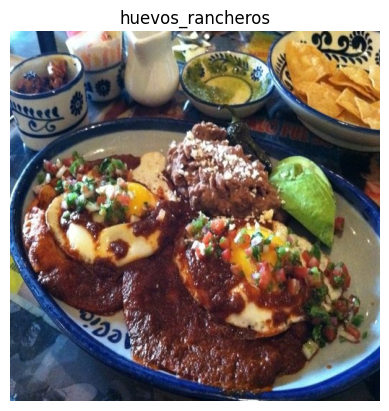

In [ ]:
# Plot an image tensor
import matplotlib.pyplot as plt
plt.imshow(image)
plt.title(class_names[label.numpy()]) # Add title to iage to verify the label is associated with the right image
plt.axis(False);

In [ ]:
# Plot multiple images
import random

def plot_multiple_random_images(train_data, ds_info, num_images=10):
    """Plots num_images random images from the train_data dataset."""
    # Get the class names
    class_names = ds_info.features['label'].names
    # Convert dataset to a list for easy random sampling
    dataset_list = list(train_data.take(1000))  # Taking first 1000 samples to avoid memory issues
    random_samples = random.sample(dataset_list, num_images)

    plt.figure(figsize=(15, 6))
    for i, (image, label) in enumerate(random_samples):  # Unpacking tuple
        plt.subplot(2, 5, i + 1)
        plt.imshow(image.numpy())  # Convert Tensor to NumPy array
        plt.axis("off")
        plt.title(class_names[label.numpy()])  # Convert Tensor to NumPy array

    plt.show()

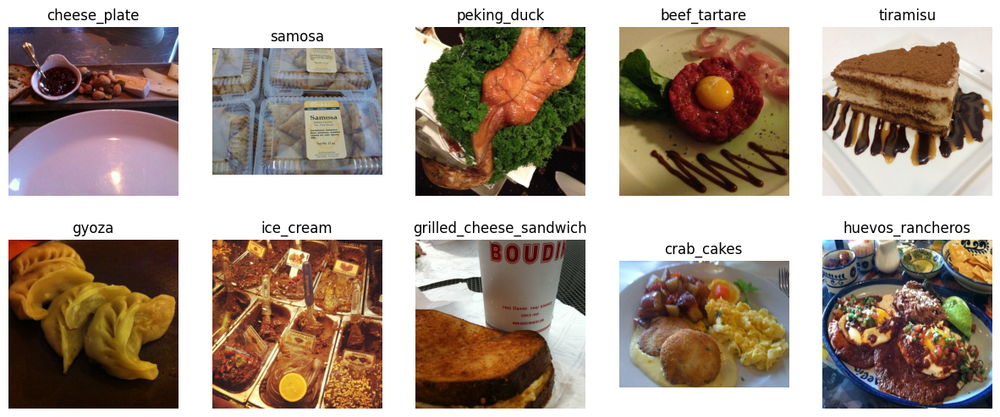

In [ ]:
plot_multiple_random_images(train_data, ds_info)

## Create preprocessing function for our data

Neural networks perform best when data is in a certain way (e.g. batched, normalized, etc).

However, not all data (including data from TensorFlow Datasets) comes like this.

So in order to get it ready for a neural network, you'll often have to write preprocessing functions and map it to your data.

What we know about our data:
* In `tf.uint8` datatype
* Comprised of all different size tensors (different sized images)
* Not scaled (the pixel values are between 0 & 255)

What we know models like:
* Data in `float32` dtype (or for mixed precision `float16`)
* For batches, TensorFlow likes all of the tensors within a batch to be of the same size
* Scaled (values between 0 & 1) also called normalized tensors generally perform better

With these points in mind, we've got a few things we can tackle with a preprocessing function.

Since we're going to be using an EfficientNetBX pretrained model from tf.keras.applications we don't need to rescale our data (these architectures have rescaling built-in).

This means our function needs to:
1. Reshape our images to all the same size
2. Convert the dtype of our image tensors from`tf.uint8` to `float32`

In [ ]:
# Make a function for preprocessing images
def preprocess_img(image, label, img_shape=224):
  """
  Convert image datatype from 'uint8' -> 'float32' and reshapes
  image to [img_shape, img_shape, color_channels]
  """
  image = tf.image.resize(image, [img_shape, img_shape])
  # image = image/255. # scale image values (not required with EfficientNet models from tf.keras.applications)
  return tf.cast(image, tf.float32), label # return (float32_image, label) tuple

In [ ]:
# Preprocess a single sampel image and check the outputs
preprocessed_img = preprocess_img(image, label)[0]
print(f'Image before preprocessing:\n {image[:2]}..., \nShape: {image.shape}, \nDatatype: {image.dtype}\n')
print(f'Image after preprocessing:\n {preprocessed_img[:2]}..., \nShape: {preprocessed_img.shape}, \nDatatype: {preprocessed_img.dtype}')

Image before preprocessing:
 [[[233 253 251]
  [231 253 250]
  [228 254 251]
  ...
  [ 85  82  89]
  [ 68  67  75]
  [ 57  57  67]]

 [[232 254 252]
  [229 254 251]
  [226 255 251]
  ...
  [121 116 120]
  [100  99 104]
  [ 86  85  91]]]..., 
Shape: (512, 512, 3), 
Datatype: <dtype: 'uint8'>

Image after preprocessing:
 [[[230.65816 253.64285 251.     ]
  [222.99998 254.97449 252.19388]
  [207.06633 255.      250.36734]
  ...
  [140.66287 129.52519 121.22428]
  [121.14268 115.26515 116.95397]
  [ 83.95363  83.08119  89.63737]]

 [[221.47449 254.37755 253.33163]
  [214.5102  255.      253.92348]
  [198.41327 254.58673 251.96939]
  ...
  [208.66318 195.82143 173.40823]
  [197.03056 190.1071  174.83162]
  [175.54036 171.6169  161.21384]]]..., 
Shape: (224, 224, 3), 
Datatype: <dtype: 'float32'>


## Batch & prepare datasets

We're now going to make our data input pipeline run really fast.

For more resources on this, I'd highly recommend going through the following guide: https://www.tensorflow.org/guide/data_performance

In [ ]:
# Map preprocessing function to training data (and parallelize it)
train_data = train_data.map(map_func=preprocess_img, num_parallel_calls=tf.data.AUTOTUNE) # delegates the decision about what level of parallelism to use to the tf.data runtime
# Shuffle train_data and turn it into batches and prefetch it (load it faster)
# ideally you can set '.shuffle(buffer_size=len(train_data))' but we don't have enough RAM
train_data = train_data.shuffle(buffer_size=1000).batch(batch_size=32).prefetch(buffer_size=tf.data.AUTOTUNE)

# Map preprocessing function to the test data
test_data = test_data.map(preprocess_img, num_parallel_calls=tf.data.AUTOTUNE).batch(32).prefetch(tf.data.AUTOTUNE)

In [ ]:
train_data, test_data

(<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>,
 <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>)

In [ ]:
# Datasets are now batched
for image, label in train_data.take(1):
  print(len(image))
  print(len(label))

32
32


> "Hey, TensorFlow, map this preprocessing function (`preprocess_img`) across our trianing dataset, then shuffle a number of elements and then batch them together and finally make sure you prepare new batches (prefetch) whilst the model is looking through (finding patterns) the current batch."

## Create modelling callbacks

We're going to create a couple callbacks to help us while our model trains:
* TensorBoard callback to log training results (so we can visualize them later if need be)
* ModelCheckpoint callback to save our model's progress after feature extraction

In [ ]:
# Create tensorboard callback (import from helper_functions.py)
from helper_functions import create_tensorboard_callback

# Create ModelCheckpoint callback to save a model's progress during training
checkpoint_path = 'model_checkpoints/checkpoint.weights.h5'
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path,
                                                      monitor='val_acc',
                                                      save_best_only=True,
                                                      save_weights_only=True,
                                                      verbose=0) # don't print whether or not model is being saved

## Setup mixed precision training

Mixed precision utilizes a combination of float32 and float16 data types to speed up model performance.

In [ ]:
# Turn on mixed precision training
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16') # set global data policy to mixed precision

In [ ]:
mixed_precision.global_policy()

<DTypePolicy "mixed_float16">

## Build feature extraction model

In [ ]:
from tensorflow.keras import layers

# Create the base model
input_shape = (224, 224, 3)
base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(include_top=False)
base_model.trainable = False

# Create functional model
inputs = layers.Input(shape=input_shape, name='input_layer')
# Note: EfficientNet models have rescaling built in, but if your model doesn't you can have a layer like below
# x = layers.Rescaling(1./255)(x)
x = base_model(inputs, training=False) # make sure layers which should be in infereence mode only stay like that
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(len(class_names))(x)
outputs = layers.Activation('softmax', dtype=tf.float32, name='softmax_float32')(x)
model = tf.keras.Model(inputs, outputs)

# Compile the model
model.compile(loss='sparse_categorical_crossentropy', # labels are NOT one-hot encoded, instead they are in integer form
              optimizer=tf.keras.optimizers.Adam(),
              metrics=['accuracy'])

24274472/24274472 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetv2-b0 (Functional)       │ (None, 7, 7, 1280)          │       5,919,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 101)                 │         129,381 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_1 (Cast)                        │ (None, 101)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ softmax_float32 (Activation)         │ (None, 101)                 │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,048,693 (23.07 MB)

 Trainable params: 129,381 (505.39 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

## Checking layer dtype policies (are we using mixed precision?)

In [ ]:
# Check the dtype_policy attributes of layers
for layer in model.layers:
  print(layer.name, layer.trainable, layer.dtype, layer.dtype_policy)

input_layer True float32 <DTypePolicy "mixed_float16">
efficientnetv2-b0 False float32 <DTypePolicy "mixed_float16">
global_average_pooling2d True float32 <DTypePolicy "mixed_float16">
dense True float32 <DTypePolicy "mixed_float16">
softmax_float32 True float32 <DTypePolicy "float32">


Going through the above we see:
* `layer.name`: the human readable name of a particular layer
* `layer.trainable`: is the layer trainable or not? (if `False`, the weights are frozen)
* `layer.dtype`: the datatype a layer stores its variables in
* `layer.dtype_policy`: the datatype policy a layer computes on it's variables with

In [ ]:
# Layers also have specific variable_dtype and compute_dtype attributes specifically
for layer in model.layers:
  print(layer.variable_dtype, layer.compute_dtype)

float32 float16
float32 float16
float32 float16
float32 float16
float32 float32


In [ ]:
# Check the dtype_policy attributes of the efficientnetv2-b0 layer
for layer in model.layers[1].layers[:20]:
  print(layer.name, layer.trainable, layer.dtype, layer.dtype_policy)

input_layer False float32 <DTypePolicy "mixed_float16">
rescaling False float32 <DTypePolicy "mixed_float16">
normalization False float32 <DTypePolicy "mixed_float16">
stem_conv False float32 <DTypePolicy "mixed_float16">
stem_bn False float32 <DTypePolicy "mixed_float16">
stem_activation False float32 <DTypePolicy "mixed_float16">
block1a_project_conv False float32 <DTypePolicy "mixed_float16">
block1a_project_bn False float32 <DTypePolicy "mixed_float16">
block1a_project_activation False float32 <DTypePolicy "mixed_float16">
block2a_expand_conv False float32 <DTypePolicy "mixed_float16">
block2a_expand_bn False float32 <DTypePolicy "mixed_float16">
block2a_expand_activation False float32 <DTypePolicy "mixed_float16">
block2a_project_conv False float32 <DTypePolicy "mixed_float16">
block2a_project_bn False float32 <DTypePolicy "mixed_float16">
block2b_expand_conv False float32 <DTypePolicy "mixed_float16">
block2b_expand_bn False float32 <DTypePolicy "mixed_float16">
block2b_expand_ac

## Fit the feature extraction model

If our goal is to fine-tune a pre-trained model, the general order of doing things is:
1. Build a feature extraction model (train a couple of output layers with base frozen)
2. Fine-tune some of the frozen layers

In [ ]:
# Fit the feature extraction model with callbacks
history_101_food_classes_feature_extract = model.fit(train_data,
                                                     epochs=3,
                                                     steps_per_epoch=(len(train_data)),
                                                     validation_data=test_data,
                                                     validation_steps=int(0.15 * len(test_data)),
                                                     callbacks=[create_tensorboard_callback(dir_name='training_logs',
                                                                                            experiment_name='efficientnetv2-b0_101_classes_all_data_feature_extract'),
                                                                model_checkpoint])

Saving TensorBoard log files to: training_logs/efficientnetv2-b0_101_classes_all_data_feature_extract/20250312-023211
Epoch 1/3
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 238s 86ms/step - accuracy: 0.4587 - loss: 2.3607 - val_accuracy: 0.6915 - val_loss: 1.1577
Epoch 2/3


/usr/local/lib/python3.11/dist-packages/keras/src/callbacks/model_checkpoint.py:209: UserWarning: Can save best model only with val_acc available, skipping.
  self._save_model(epoch=epoch, batch=None, logs=logs)


2368/2368 ━━━━━━━━━━━━━━━━━━━━ 198s 67ms/step - accuracy: 0.6566 - loss: 1.3360 - val_accuracy: 0.7256 - val_loss: 1.0432
Epoch 3/3
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 150s 62ms/step - accuracy: 0.6883 - loss: 1.1896 - val_accuracy: 0.7309 - val_loss: 0.9956


In [ ]:
# Evaluate model on whole test dataset
results_feature_extract_model = model.evaluate(test_data)
results_feature_extract_model

790/790 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - accuracy: 0.7274 - loss: 1.0019


[1.004726767539978, 0.7259010076522827]

## TODO: Save the whole model to file



In [ ]:
# Save model locally (if you're using Google Colab, your saved model will Colab instance terminates)
from google.colab import drive
drive.mount('/content/drive')

model.save('/content/drive/MyDrive/tensorflow_with_daniel_bourke/101_food_classes_100_percent_big_model.keras')

Mounted at /content/drive


In [ ]:
# Load model previously saved above
loaded_feature_extract_model = tf.keras.models.load_model('/content/drive/MyDrive/tensorflow_with_daniel_bourke/101_food_classes_100_percent_big_model.keras')

In [ ]:
# Check the layers in the base model and see what dtype policy they're using
for layer in loaded_feature_extract_model.layers[1].layers[:20]:
  print(layer.name, layer.trainable, layer.dtype, layer.dtype_policy)

input_layer True float32 <DTypePolicy "mixed_float16">
rescaling False float32 <DTypePolicy "mixed_float16">
normalization False float32 <DTypePolicy "mixed_float16">
stem_conv False float32 <DTypePolicy "mixed_float16">
stem_bn False float32 <DTypePolicy "mixed_float16">
stem_activation False float32 <DTypePolicy "mixed_float16">
block1a_project_conv False float32 <DTypePolicy "mixed_float16">
block1a_project_bn False float32 <DTypePolicy "mixed_float16">
block1a_project_activation False float32 <DTypePolicy "mixed_float16">
block2a_expand_conv False float32 <DTypePolicy "mixed_float16">
block2a_expand_bn False float32 <DTypePolicy "mixed_float16">
block2a_expand_activation False float32 <DTypePolicy "mixed_float16">
block2a_project_conv False float32 <DTypePolicy "mixed_float16">
block2a_project_bn False float32 <DTypePolicy "mixed_float16">
block2b_expand_conv False float32 <DTypePolicy "mixed_float16">
block2b_expand_bn False float32 <DTypePolicy "mixed_float16">
block2b_expand_act

In [ ]:
# Check loaded model performance (this should be the same as results_feature_extract_model)
results_loaded_feature_extract_model = loaded_feature_extract_model.evaluate(test_data)
results_loaded_feature_extract_model

790/790 ━━━━━━━━━━━━━━━━━━━━ 59s 62ms/step - accuracy: 0.7273 - loss: 1.0020


[1.004726529121399, 0.7259010076522827]

In [ ]:
# The loaded model's results should equal (or at least be very close) to the model's results prior to saving
# Note: this will only work if you've instatiated results variables
import numpy as np
def compar_model_results(model_results):
  first_model_loss, first_model_accuracy = model_results[0][0], model_results[0][1]
  second_model_loss, second_model_accuracy = model_results[1][0], model_results[1][1]

  print(f'The LOSS values of the models close: {np.isclose(first_model_loss, second_model_loss)}')
  print(f'The difference between the LOSS values of the models: {first_model_loss - second_model_loss}')
  print('\n')
  print(f'The ACCURACY values of the models close: {np.isclose(first_model_accuracy, second_model_accuracy)}')
  print(f'The difference between the ACCURACY values of the models: {first_model_accuracy - second_model_accuracy}')

In [ ]:
compar_model_results(model_results=[results_feature_extract_model, results_loaded_feature_extract_model])

The LOSS values of the models close: True
The difference between the LOSS values of the models: 2.384185791015625e-07


The ACCURACY values of the models close: True
The difference between the ACCURACY values of the models: 0.0


## TODO: Preparing our model's layers for fine-tuning

In [ ]:
# Download the saved model
from google.colab import drive
drive.mount('/content/drive')

fine_tuned_model = tf.keras.models.load_model('/content/drive/MyDrive/tensorflow_with_daniel_bourke/101_food_classes_100_percent_big_model.keras')

Mounted at /content/drive


In [ ]:
# Evaluate the downloaded model
results_original_model = fine_tuned_model.evaluate(test_data)
results_original_model

790/790 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step - accuracy: 0.7271 - loss: 1.0018


[1.0047199726104736, 0.7258613705635071]

In [ ]:
# Get a summary of the downloaded model
fine_tuned_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetv2-b0 (Functional)       │ (None, 7, 7, 1280)          │       5,919,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 101)                 │         129,381 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_1 (Cast)                        │ (None, 101)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ softmax_float32 (Activation)         │ (None, 101)                 │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,307,461 (24.06 MB)

 Trainable params: 129,381 (505.39 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

 Optimizer params: 258,768 (1010.82 KB)

In [ ]:
# Set all the layers in the model to trainable
fine_tuned_model.layers[1].trainable = True

In [ ]:
# Check to see what layers are trainable
for layer in fine_tuned_model.layers:
  print(layer.name, layer.trainable)

input_layer True
efficientnetv2-b0 True
global_average_pooling2d True
dense True
softmax_float32 True


In [ ]:
for layer in fine_tuned_model.layers[1].layers[:20]:
  print(layer.name, layer.trainable)

input_layer True
rescaling True
normalization True
stem_conv True
stem_bn True
stem_activation True
block1a_project_conv True
block1a_project_bn True
block1a_project_activation True
block2a_expand_conv True
block2a_expand_bn True
block2a_expand_activation True
block2a_project_conv True
block2a_project_bn True
block2b_expand_conv True
block2b_expand_bn True
block2b_expand_activation True
block2b_project_conv True
block2b_project_bn True
block2b_drop True


In [ ]:
# Check to see what dtype_policy of the layers in your loaded model are
for layer in fine_tuned_model.layers:
  print(layer.name, layer.trainable, layer.dtype, layer.dtype_policy)

input_layer True float32 <DTypePolicy "mixed_float16">
efficientnetv2-b0 True float32 <DTypePolicy "mixed_float16">
global_average_pooling2d True float32 <DTypePolicy "mixed_float16">
dense True float32 <DTypePolicy "mixed_float16">
softmax_float32 True float32 <DTypePolicy "float32">


In [ ]:
# Check the dtype_policy of the layers in the base model (efficientnetv2-b0)
for layer in fine_tuned_model.layers[1].layers[:20]:
  print(layer.name, layer.trainable, layer.dtype, layer.dtype_policy)

input_layer True float32 <DTypePolicy "mixed_float16">
rescaling True float32 <DTypePolicy "mixed_float16">
normalization True float32 <DTypePolicy "mixed_float16">
stem_conv True float32 <DTypePolicy "mixed_float16">
stem_bn True float32 <DTypePolicy "mixed_float16">
stem_activation True float32 <DTypePolicy "mixed_float16">
block1a_project_conv True float32 <DTypePolicy "mixed_float16">
block1a_project_bn True float32 <DTypePolicy "mixed_float16">
block1a_project_activation True float32 <DTypePolicy "mixed_float16">
block2a_expand_conv True float32 <DTypePolicy "mixed_float16">
block2a_expand_bn True float32 <DTypePolicy "mixed_float16">
block2a_expand_activation True float32 <DTypePolicy "mixed_float16">
block2a_project_conv True float32 <DTypePolicy "mixed_float16">
block2a_project_bn True float32 <DTypePolicy "mixed_float16">
block2b_expand_conv True float32 <DTypePolicy "mixed_float16">
block2b_expand_bn True float32 <DTypePolicy "mixed_float16">
block2b_expand_activation True fl

In [ ]:
# Setup EarlyStopping callback to stop training if model's val_loss doesn't improve for 3 epochs
# Monitor the val_loss and stop training if it doesn't improve for 3 epochs
# See: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping for more
from tensorflow.keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss',
                               patience=3,
                               mode='min',
                               restore_best_weights=True)

# Create ModelCheckpoint callback to save best model during fine-tuning
# Save the best model only
# Monitor val_loss while training and save the best model (lowest val_loss)
# See: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/ModelCheckpoint for more
checkpoint_path = 'model_checkpoint/checkpoint.weights.h5'
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path,
                                                      monitor='val_loss', # monitoring the lowest loss on validation data
                                                      save_best_only=True,
                                                      save_weights_only=True,
                                                      verbose=0)

# Create a tensorboard callback from helper_functions.py
from helper_functions import create_tensorboard_callback

In [ ]:
# Compile the model ready for fine-tuning
# Use the Adam optimizer with a 10x lower than default learning rate
fine_tuned_model.compile(loss='sparse_categorical_crossentropy',
                         optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), # lowering learning rate by 10x for fine tuning
                         metrics=['accuracy'])

In [ ]:
# Start to fine-tune (all layers)
# Use 100 epochs as the default
# Validate on 15% of the test_data
# Use the create_tensorboard_callback, ModelCheckpoint and EarlyStopping callbacks you created eaelier
fine_tuned_history = fine_tuned_model.fit(train_data,
                                          epochs=100,
                                          validation_data=test_data,
                                          validation_steps=int(0.15 * len(test_data)),
                                          callbacks=[create_tensorboard_callback(dir_name='training_logs',
                                                                                 experiment_name='efficientnetv2-b0_101_classes_all_data_fined_tuned'),
                                                     model_checkpoint,
                                                     early_stopping])

Saving TensorBoard log files to: training_logs/efficientnetv2-b0_101_classes_all_data_fined_tuned/20250312-223432
Epoch 1/100
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 380s 112ms/step - accuracy: 0.6433 - loss: 1.4094 - val_accuracy: 0.8075 - val_loss: 0.6821
Epoch 2/100
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 259s 108ms/step - accuracy: 0.8026 - loss: 0.7342 - val_accuracy: 0.8287 - val_loss: 0.6169
Epoch 3/100
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 201s 84ms/step - accuracy: 0.8612 - loss: 0.5116 - val_accuracy: 0.8398 - val_loss: 0.5812
Epoch 4/100
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 201s 83ms/step - accuracy: 0.9075 - loss: 0.3507 - val_accuracy: 0.8416 - val_loss: 0.5821
Epoch 5/100
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 261s 109ms/step - accuracy: 0.9363 - loss: 0.2521 - val_accuracy: 0.8472 - val_loss: 0.5846
Epoch 6/100
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 204s 85ms/step - accuracy: 0.9541 - loss: 0.1806 - val_accuracy: 0.8387 - val_loss: 0.6157


In [ ]:
# Save the fine-tuned model
fine_tuned_model.save('/content/drive/MyDrive/tensorflow_with_daniel_bourke/101_food_classes_100_percent_big_model_fine_tuned.keras')

In [ ]:
# Evaluate mixed precision fine-tuned model (this should beat DeepFood's 77.4% top-1 accuracy)
results_fine_tuned_model = fine_tuned_model.evaluate(test_data)
results_fine_tuned_model

790/790 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - accuracy: 0.8359 - loss: 0.5891


[0.5902754664421082, 0.8346138596534729]

In [ ]:
model_list = [results_original_model, results_fine_tuned_model]

for model in range(len(model_list)):
  loss = model_list[model][0]
  accuracy = model_list[model][1]

  print(f'Model {model + 1} -> Loss: {loss}, Accuracy: {accuracy}')

Model 1 -> Loss: 1.0047199726104736, Accuracy: 0.7258613705635071
Model 2 -> Loss: 0.5902754664421082, Accuracy: 0.8346138596534729


In [ ]:
print(len(metrics))

2


In [ ]:
# Improve compare_model_results function
def compare_model_results(model_results):
  for results in range(len(model_results)):
    loss = model_results[results][0]
    accuracy = model_results[results][1]

    print(f'Model {results + 1} -> Loss: {loss}, Accuracy: {accuracy}')

In [ ]:
compare_model_results(model_results=[results_original_model, results_fine_tuned_model])

Model 1 -> Loss: 1.0047199726104736, Accuracy: 0.7258613705635071
Model 2 -> Loss: 0.5902754664421082, Accuracy: 0.8346138596534729


## TODO: View training results on TensorBoard

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir=training_logs --window_title="Food101 Fine Tuned Model with 100 Percent of Data"

<IPython.core.display.Javascript object>

## TODO: Evaluate your trained model

1. Find the precision, recall and f1 scores for each class (all 101).
2. Build a confusion matrix for each of the classes.
3. Find your model's most wrong predictions (those with the highest prediction probability but the wrong prediction).

Since our `test_data` is a TensorFlow dataset, we need to extract the true labels and then use the model to make predictions.

In [ ]:
# Extract y_true labels and predictions
import numpy as np
y_true = []
y_pred = []

for images, labels in test_data:
  preds = fine_tuned_model.predict(images)
  y_pred.extend(np.argmax(preds, axis=1))
  y_true.extend(labels.numpy())

# Convert lists to NumPy arrays
y_true = np.array(y_true)
y_pred = np.array(y_pred)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━

In [ ]:
len(y_true), len(y_pred)

(25250, 25250)

In [ ]:
y_true[:10], y_pred[:10]

(array([44, 84, 60, 29, 80, 32, 78, 17,  1, 40]),
 array([44, 44, 60, 29, 80, 32, 78, 17,  1, 40]))

In [ ]:
# Get the class names
class_names = ds_info.features['label'].names
class_names[:10]

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito']

In [ ]:
for i in range(10):
  print(f'Class name: {class_names[y_true[i]]}, Prediction: {class_names[y_pred[i]]}')

Class name: fried_rice, Prediction: fried_rice
Class name: risotto, Prediction: fried_rice
Class name: lobster_bisque, Prediction: lobster_bisque
Class name: cup_cakes, Prediction: cup_cakes
Class name: pulled_pork_sandwich, Prediction: pulled_pork_sandwich
Class name: dumplings, Prediction: dumplings
Class name: poutine, Prediction: poutine
Class name: cheese_plate, Prediction: cheese_plate
Class name: baby_back_ribs, Prediction: baby_back_ribs
Class name: french_fries, Prediction: french_fries


In [ ]:
# Generate a classification report
from sklearn.metrics import classification_report

report = classification_report(y_true, y_pred, target_names=class_names)

In [ ]:
print(report)

                         precision    recall  f1-score   support

              apple_pie       0.70      0.61      0.65       250
         baby_back_ribs       0.81      0.85      0.83       250
                baklava       0.91      0.86      0.88       250
         beef_carpaccio       0.89      0.83      0.86       250
           beef_tartare       0.76      0.82      0.79       250
             beet_salad       0.74      0.70      0.72       250
               beignets       0.85      0.89      0.87       250
               bibimbap       0.90      0.96      0.93       250
          bread_pudding       0.68      0.69      0.69       250
      breakfast_burrito       0.81      0.76      0.78       250
             bruschetta       0.78      0.78      0.78       250
           caesar_salad       0.87      0.86      0.87       250
                cannoli       0.91      0.92      0.92       250
          caprese_salad       0.85      0.83      0.84       250
            carrot_cake 

In [ ]:
# Get the overall accuracy
from sklearn.metrics import accuracy_score

overall_accuracy = accuracy_score(y_true, y_pred)
print(f'Overall accuracy: {overall_accuracy:.4f}')
print(f'fine_tuned_model accuracy: {results_fine_tuned_model[1]:.4f}')

Overall accuracy: 0.8346
fine_tuned_model accuracy: 0.8346


In [ ]:
# Get the accuracy score for each class
class_accuracies = {}

for class_index, class_name in enumerate(class_names):
  # Get indices where the true class is the current class
  class_mask = y_true == class_index
  # Compute accuracy for the specific class
  class_accuracy = accuracy_score(y_true[class_mask], y_pred[class_mask])
  class_accuracies[class_name] = class_accuracy

# Print per-class accuracies
for class_name, acc in class_accuracies.items():
  print(f'Accuracy for {class_name}: {acc:.4f}')

Accuracy for apple_pie: 0.6120
Accuracy for baby_back_ribs: 0.8520
Accuracy for baklava: 0.8560
Accuracy for beef_carpaccio: 0.8280
Accuracy for beef_tartare: 0.8240
Accuracy for beet_salad: 0.7040
Accuracy for beignets: 0.8920
Accuracy for bibimbap: 0.9600
Accuracy for bread_pudding: 0.6920
Accuracy for breakfast_burrito: 0.7560
Accuracy for bruschetta: 0.7800
Accuracy for caesar_salad: 0.8640
Accuracy for cannoli: 0.9240
Accuracy for caprese_salad: 0.8320
Accuracy for carrot_cake: 0.7880
Accuracy for ceviche: 0.6560
Accuracy for cheesecake: 0.7240
Accuracy for cheese_plate: 0.8440
Accuracy for chicken_curry: 0.8080
Accuracy for chicken_quesadilla: 0.8800
Accuracy for chicken_wings: 0.9240
Accuracy for chocolate_cake: 0.7320
Accuracy for chocolate_mousse: 0.6480
Accuracy for churros: 0.9280
Accuracy for clam_chowder: 0.9000
Accuracy for club_sandwich: 0.8840
Accuracy for crab_cakes: 0.7600
Accuracy for creme_brulee: 0.9080
Accuracy for croque_madame: 0.8560
Accuracy for cup_cakes: 0.9